In [14]:
import torch
from torch import nn
from torchvision import transforms, models
import os
from PIL import Image
from matplotlib import pyplot as plt

In [24]:
models.list_models()

['alexnet',
 'convnext_base',
 'convnext_large',
 'convnext_small',
 'convnext_tiny',
 'deeplabv3_mobilenet_v3_large',
 'deeplabv3_resnet101',
 'deeplabv3_resnet50',
 'densenet121',
 'densenet161',
 'densenet169',
 'densenet201',
 'efficientnet_b0',
 'efficientnet_b1',
 'efficientnet_b2',
 'efficientnet_b3',
 'efficientnet_b4',
 'efficientnet_b5',
 'efficientnet_b6',
 'efficientnet_b7',
 'efficientnet_v2_l',
 'efficientnet_v2_m',
 'efficientnet_v2_s',
 'fasterrcnn_mobilenet_v3_large_320_fpn',
 'fasterrcnn_mobilenet_v3_large_fpn',
 'fasterrcnn_resnet50_fpn',
 'fasterrcnn_resnet50_fpn_v2',
 'fcn_resnet101',
 'fcn_resnet50',
 'fcos_resnet50_fpn',
 'googlenet',
 'inception_v3',
 'keypointrcnn_resnet50_fpn',
 'lraspp_mobilenet_v3_large',
 'maskrcnn_resnet50_fpn',
 'maskrcnn_resnet50_fpn_v2',
 'maxvit_t',
 'mc3_18',
 'mnasnet0_5',
 'mnasnet0_75',
 'mnasnet1_0',
 'mnasnet1_3',
 'mobilenet_v2',
 'mobilenet_v3_large',
 'mobilenet_v3_small',
 'mvit_v1_b',
 'mvit_v2_s',
 'quantized_googlenet',
 '

In [51]:
# some helper code

data_path = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/"

def load_data(data_path, transforms_needed):
    inputs_tensors = []
    inputs_label = []
    for file in os.listdir(data_path+"inputs/"):
        img = Image.open(data_path+"inputs/"+file)
        inputs_tensors.append(transforms_needed(img))
        inputs_label.append(file)
    inputs_tensors = torch.stack(inputs_tensors, dim=0)

    target_tensors = []
    target_label = []
    for file in os.listdir(data_path+"target/"):
        img = Image.open(data_path+"target/"+file)
        target_tensors.append(transforms_needed(img))
        target_label.append(file)
    target_tensors = torch.stack(target_tensors, dim=0)
    return (inputs_tensors, inputs_label), (target_tensors, target_label)

def set_off_grad(model):
    model.eval()
    for param in model.parameters():
        param.requires_grad = False

def show_helper(inputs_label, target_label, top_class):
    for i, (file, predecition) in enumerate(zip(inputs_label, top_class)):
        sample = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/inputs/"+file
        sample = Image.open(sample)
        predecition = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/target/"+target_label[predecition.item()]
        predecition = Image.open(predecition)
        fig = plt.figure(figsize=(10,7))
        fig.add_subplot(1, 2, 1)
        plt.imshow(sample)
        fig.add_subplot(1, 2, 2)
        plt.imshow(predecition)


### Densenet

inputs_tensors.shape = torch.Size([15, 3, 96, 96]), target_tensors.shape = torch.Size([6, 3, 96, 96])


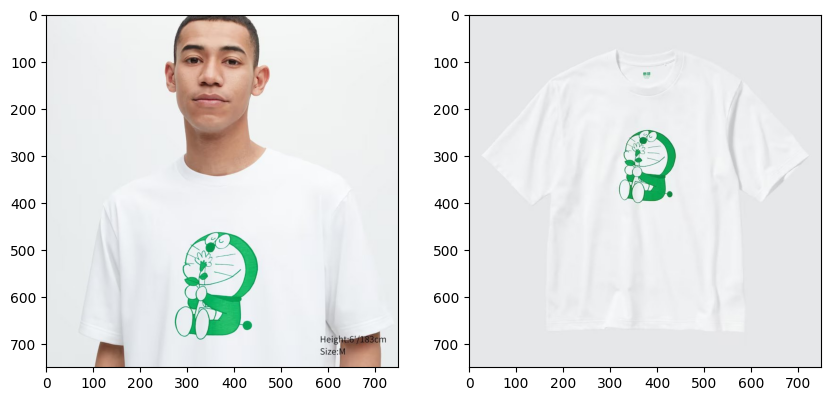

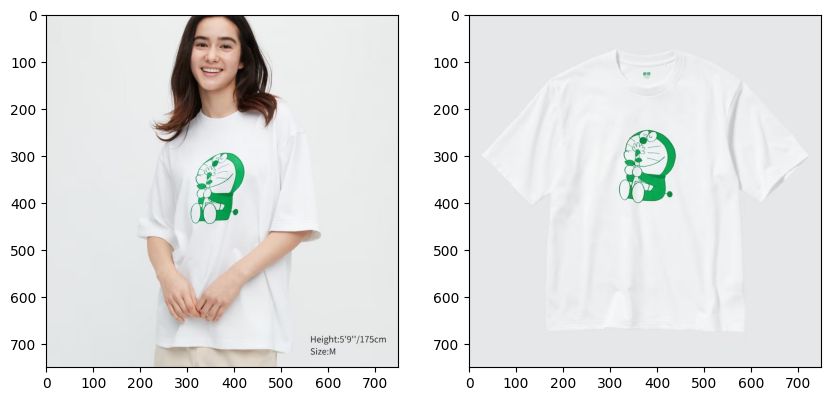

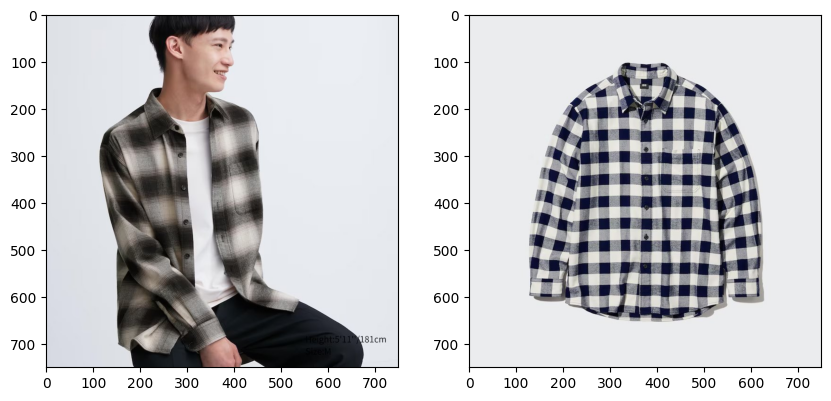

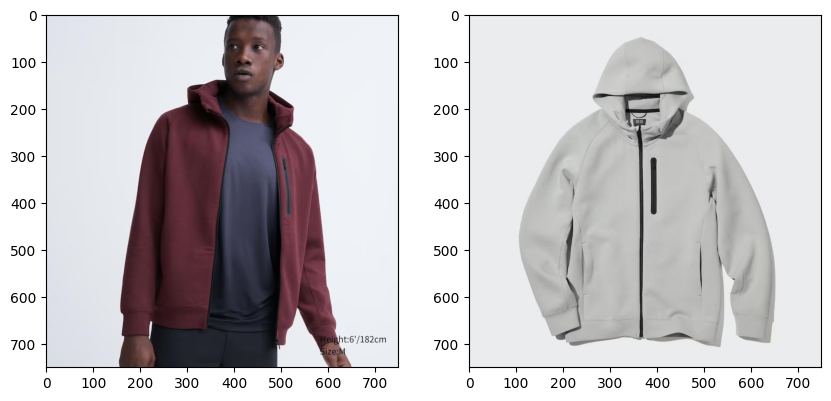

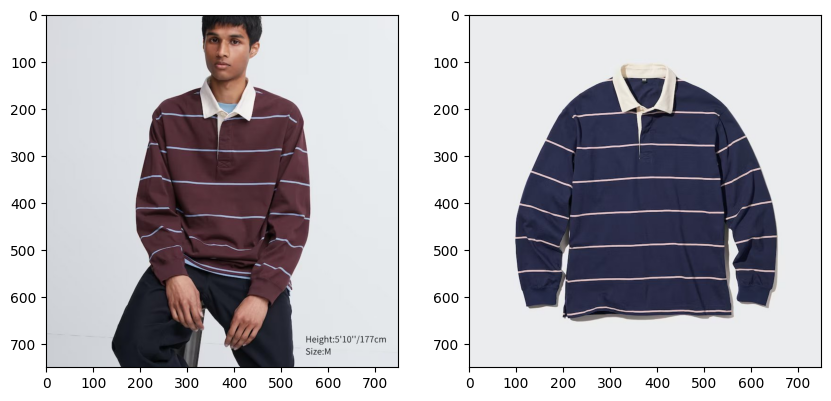

...

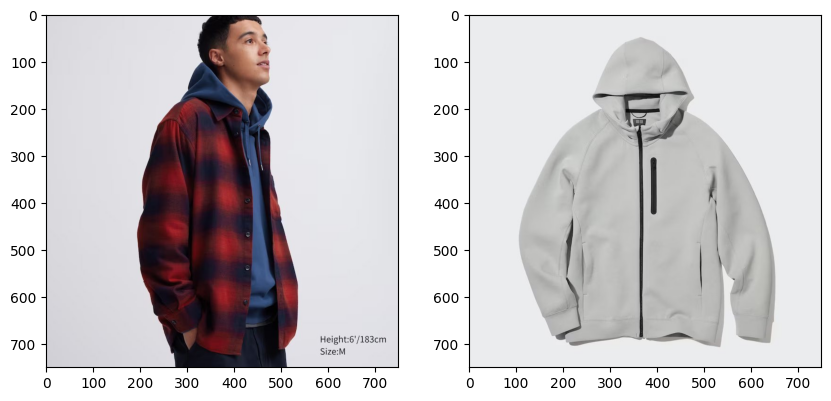

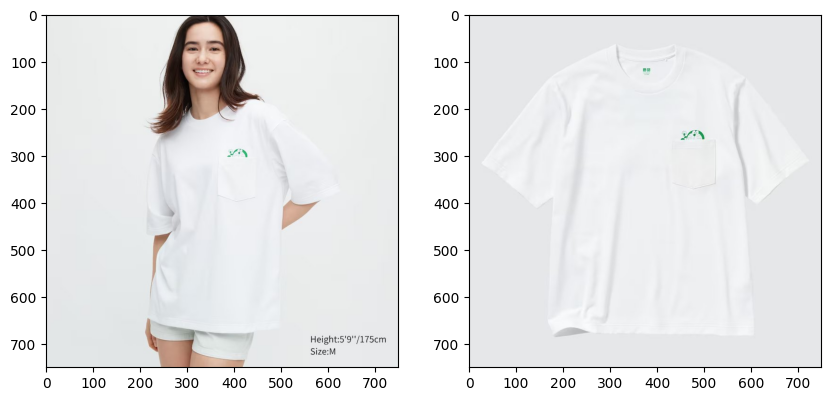

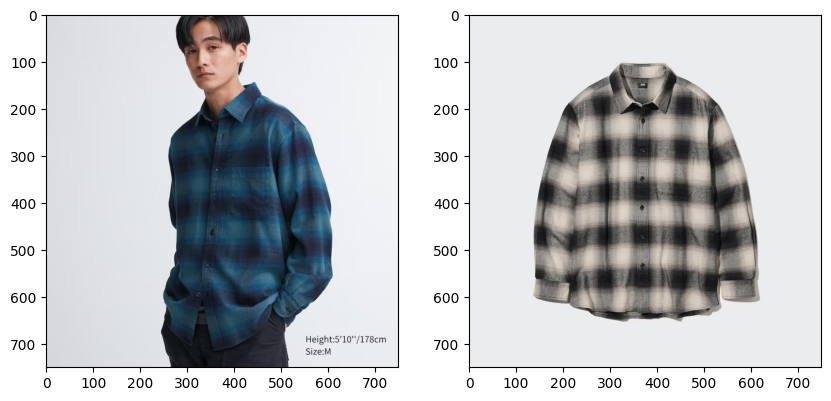

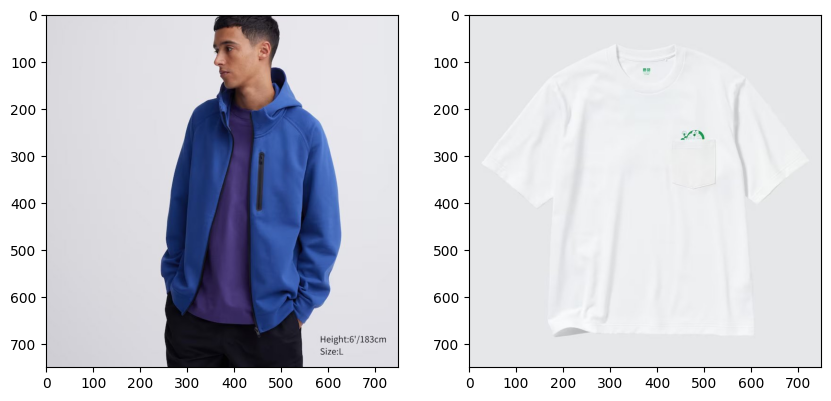

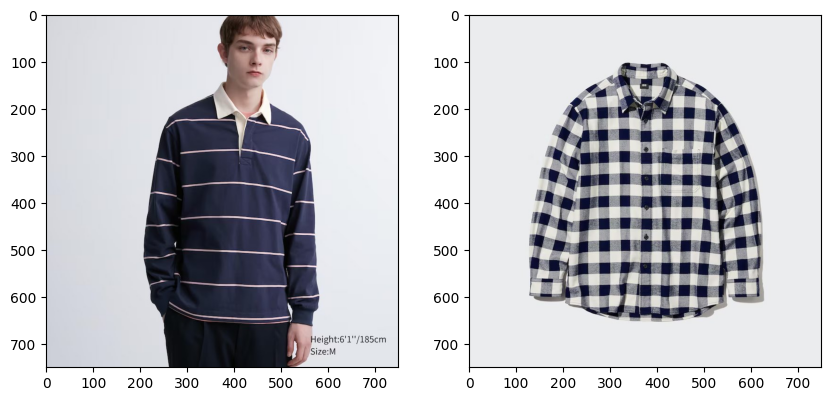

In [91]:
base_model = models.densenet121(weights=models.DenseNet121_Weights.DEFAULT)
base_model.eval()
feature_extractor = nn.Sequential(base_model.features, nn.AdaptiveAvgPool2d((1,1)))

for param in feature_extractor.parameters():
    param.requires_grad = False

transforms_needed = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(96, antialias=True),
])

(inputs_tensors, inputs_label), (target_tensors, target_label) = load_data(data_path, transforms_needed)
print(f"{inputs_tensors.shape = }, {target_tensors.shape = }")

targer_sapce = torch.squeeze(feature_extractor(target_tensors), dim = (2,3))
result = torch.squeeze(feature_extractor(inputs_tensors), dim = (2,3))

targer_sapce = nn.functional.normalize(targer_sapce, p=2, dim=1)
result = nn.functional.normalize(result, p=2, dim=1)

targer_sapce = torch.transpose(targer_sapce,dim0=0, dim1=1)
dot_products, top_class = torch.mm(result, targer_sapce).topk(1)

# for file, top_match in zip(inputs_label, top_class):
#     print(f"{file} == {target_label[top_match]}")

for i, (file, predecition) in enumerate(zip(inputs_label, top_class)):
    
    sample = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/inputs/"+file
    sample = Image.open(sample)
    predecition = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/target/"+target_label[predecition.item()]
    predecition = Image.open(predecition)
    fig = plt.figure(figsize=(10,7))
    fig.add_subplot(1, 2, 1)
    plt.imshow(sample)
    fig.add_subplot(1, 2, 2)
    plt.imshow(predecition)


### Convnext

inputs_tensors.shape = torch.Size([15, 3, 96, 96]), target_tensors.shape = torch.Size([6, 3, 96, 96])


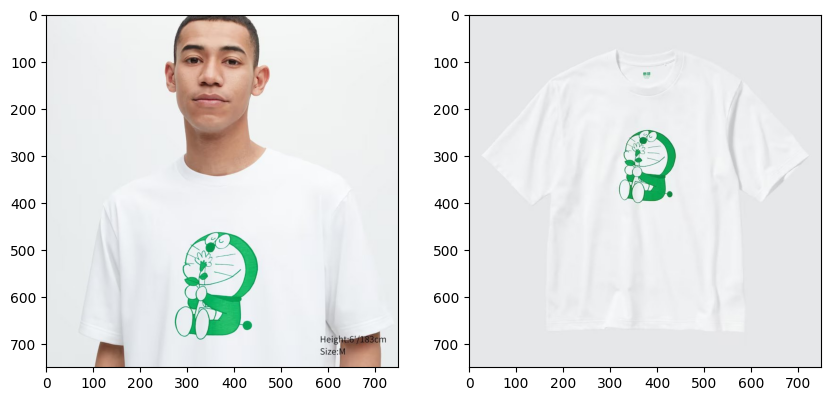

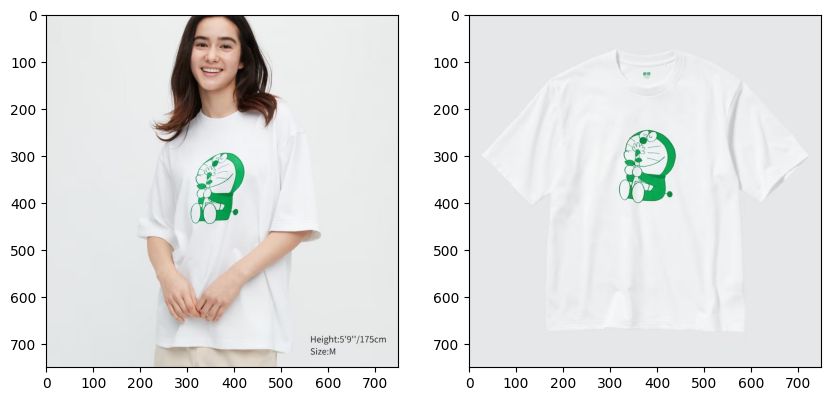

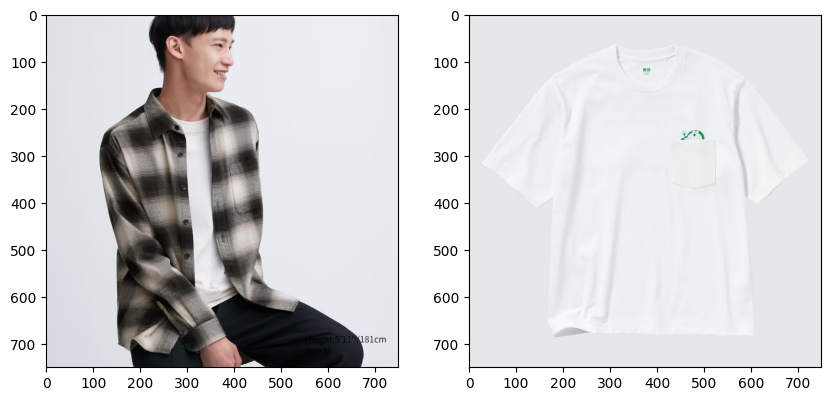

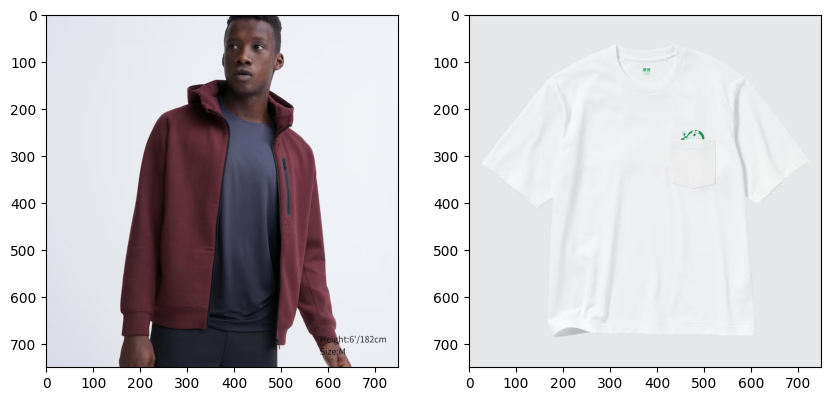

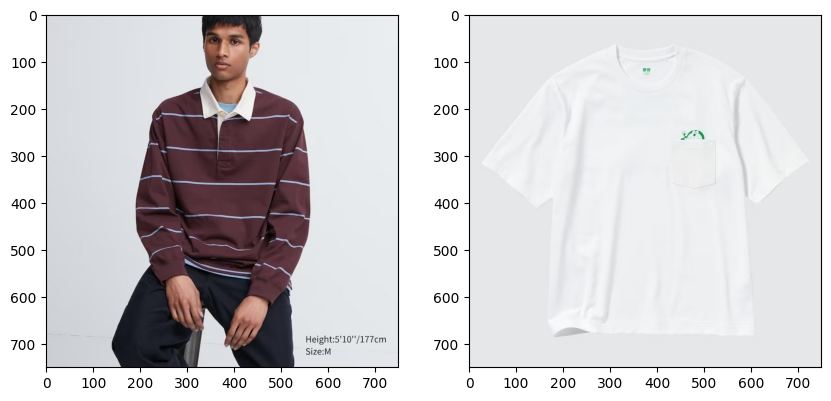

...

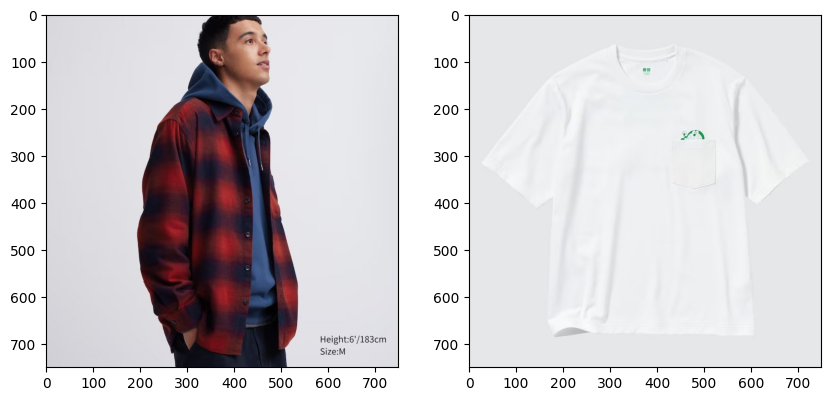

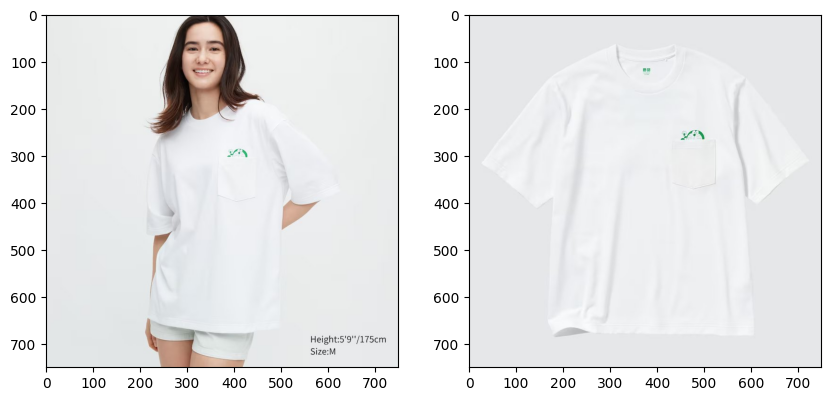

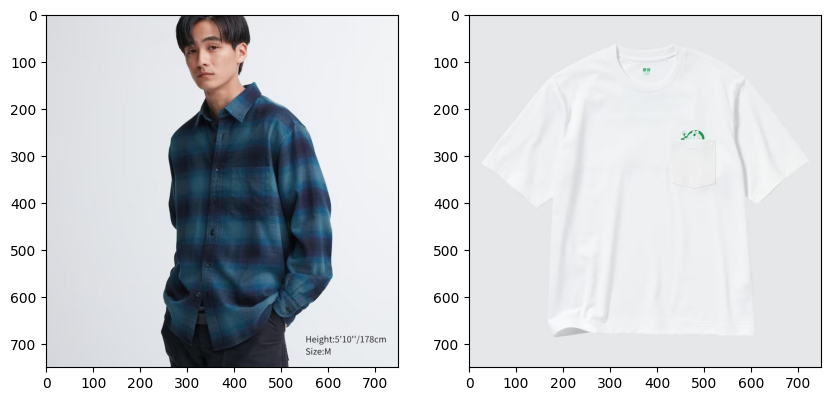

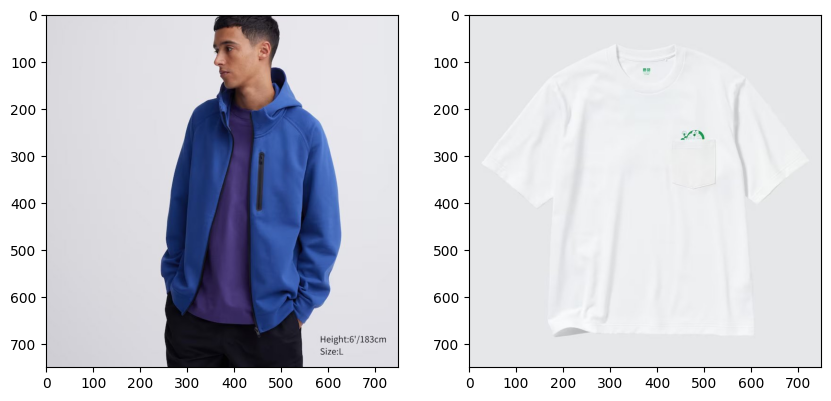

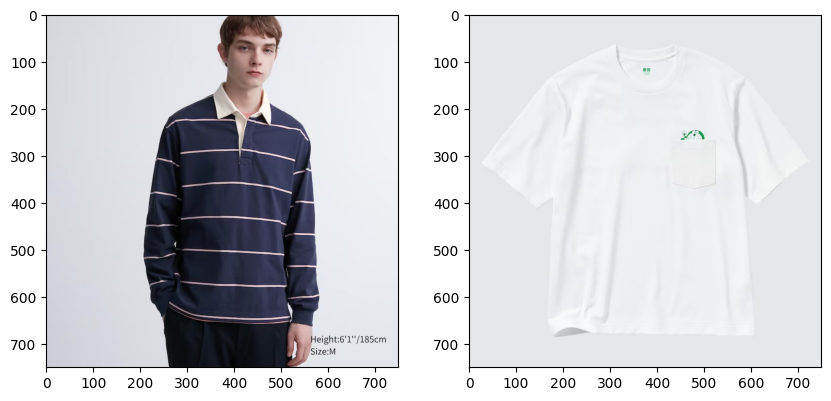

In [92]:
base_model = models.convnext_tiny(weights=models.ConvNeXt_Tiny_Weights.DEFAULT)
# base_model = models.convnext_tiny()
base_model.eval()
feature_extractor = nn.Sequential(base_model.features, base_model.avgpool)

for param in feature_extractor.parameters():
    param.requires_grad = False

transforms_needed = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(96, antialias=True),
])

(inputs_tensors, inputs_label), (target_tensors, target_label) = load_data(data_path, transforms_needed)
print(f"{inputs_tensors.shape = }, {target_tensors.shape = }")

target_tensors = feature_extractor(target_tensors)
inputs_tensors = feature_extractor(inputs_tensors)

targer_sapce = torch.squeeze(target_tensors, dim = (2,3))
result = torch.squeeze(inputs_tensors, dim = (2,3))

targer_sapce = nn.functional.normalize(targer_sapce, p=2, dim=1)
result = nn.functional.normalize(result, p=2, dim=1)

targer_sapce = torch.transpose(targer_sapce,dim0=0, dim1=1)
dot_products, top_class = torch.mm(result, targer_sapce).topk(1)

# for file, top_match in zip(inputs_label, top_class):
#     print(f"{file} == {target_label[top_match]}")

for i, (file, predecition) in enumerate(zip(inputs_label, top_class)):
    
    sample = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/inputs/"+file
    sample = Image.open(sample)
    predecition = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/target/"+target_label[predecition.item()]
    predecition = Image.open(predecition)
    fig = plt.figure(figsize=(10,7))
    fig.add_subplot(1, 2, 1)
    plt.imshow(sample)
    fig.add_subplot(1, 2, 2)
    plt.imshow(predecition)


### Alexnet


inputs_tensors.shape = torch.Size([15, 3, 224, 224]), target_tensors.shape = torch.Size([6, 3, 224, 224])
inputs_tensors.shape = torch.Size([15, 256, 1, 1]), target_tensors.shape = torch.Size([6, 256, 1, 1])
targer_sapce.shape = torch.Size([6, 256]), result.shape = torch.Size([15, 256])


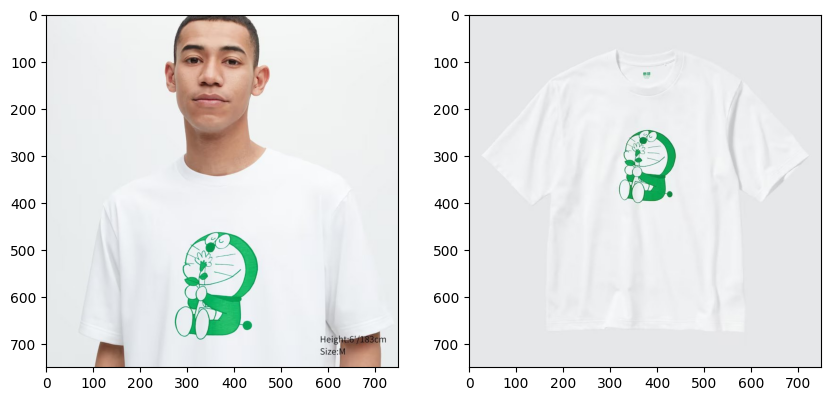

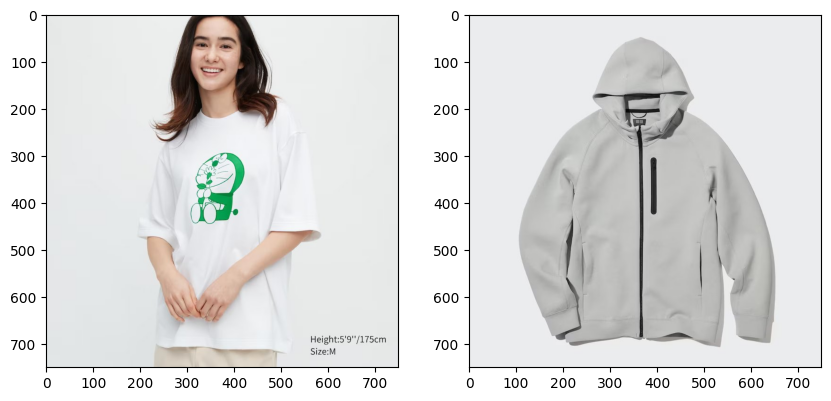

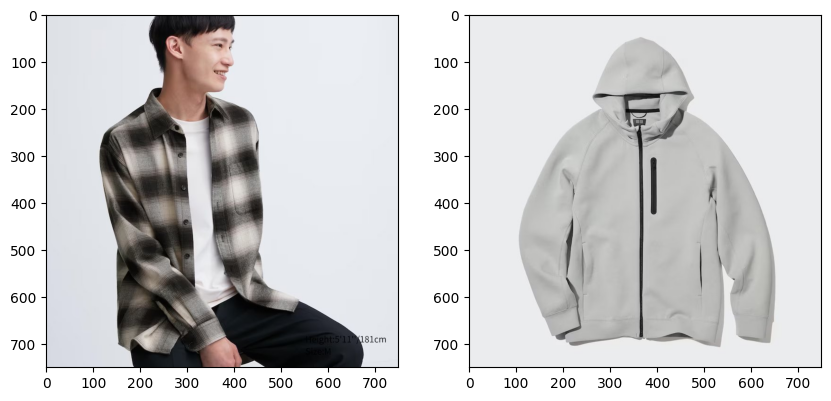

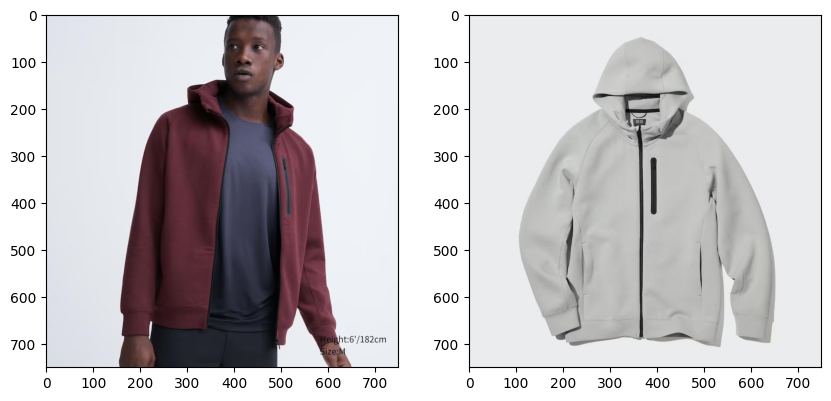

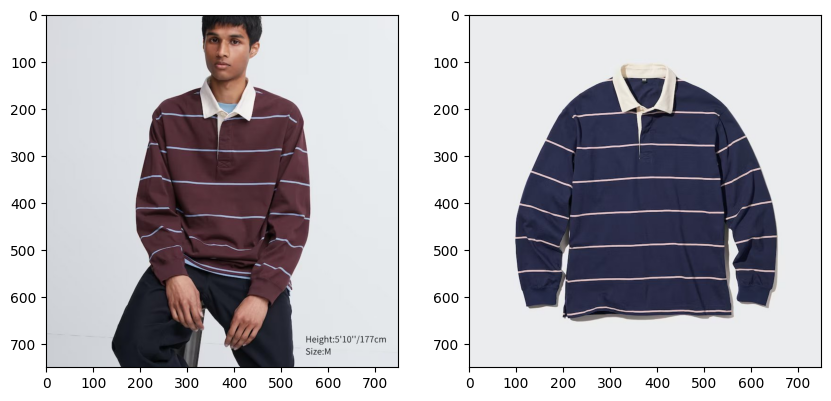

...

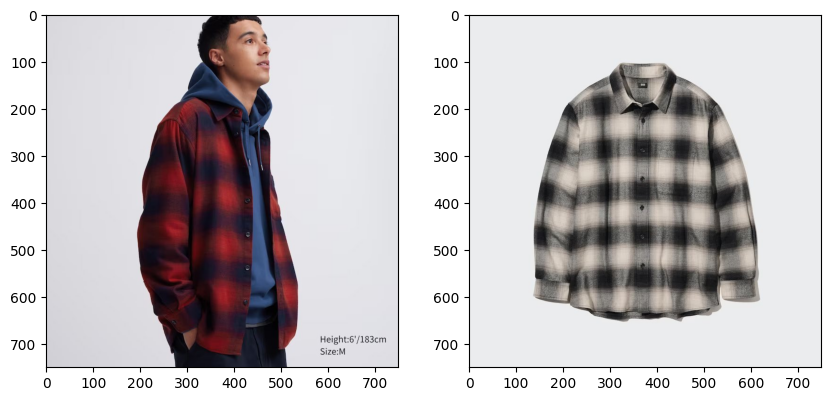

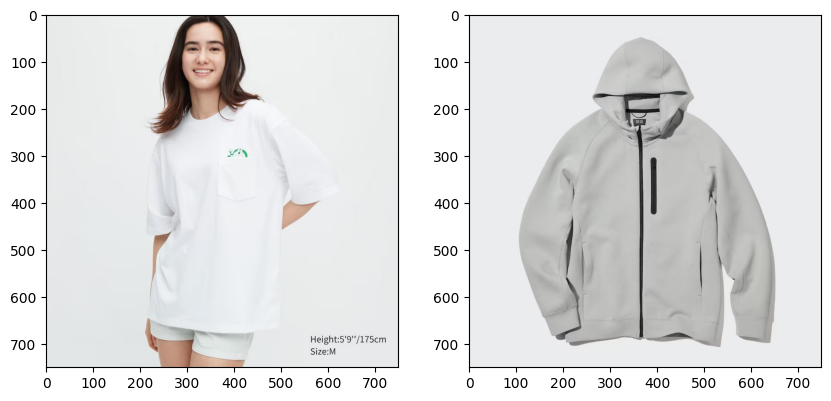

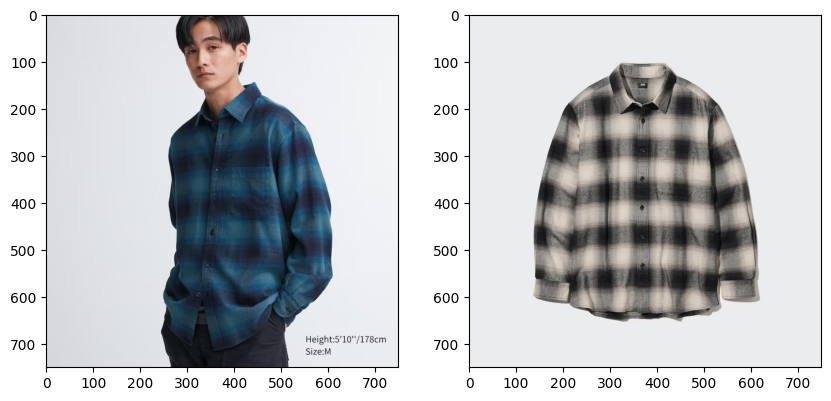

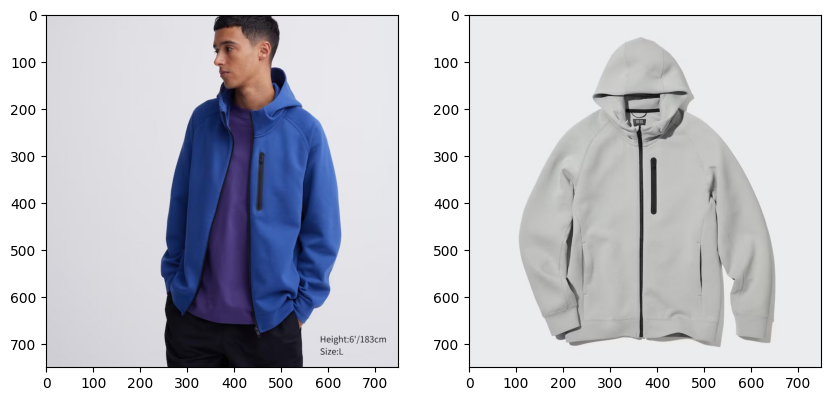

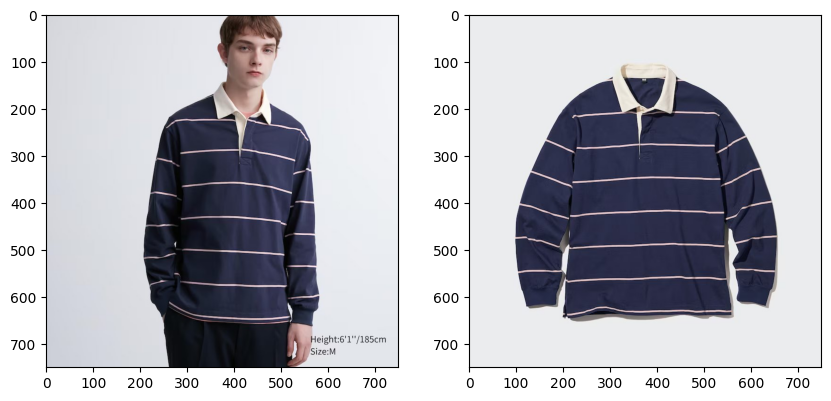

In [93]:
base_model = models.alexnet(weights=models.AlexNet_Weights.DEFAULT)
base_model.eval()
feature_extractor = nn.Sequential(base_model.features, nn.AdaptiveAvgPool2d(output_size=(1,1)))

for param in feature_extractor.parameters():
    param.requires_grad = False

transforms_needed = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(224, antialias=True),
])

(inputs_tensors, inputs_label), (target_tensors, target_label) = load_data(data_path, transforms_needed)
print(f"{inputs_tensors.shape = }, {target_tensors.shape = }")

target_tensors = feature_extractor(target_tensors)
inputs_tensors = feature_extractor(inputs_tensors)
print(f"{inputs_tensors.shape = }, {target_tensors.shape = }")

targer_sapce = torch.squeeze(target_tensors, dim = (2,3))
result = torch.squeeze(inputs_tensors, dim = (2,3))
print(f"{targer_sapce.shape = }, {result.shape = }")

targer_sapce = nn.functional.normalize(targer_sapce, p=2, dim=1)
result = nn.functional.normalize(result, p=2, dim=1)

targer_sapce = torch.transpose(targer_sapce,dim0=0, dim1=1)
dot_products, top_class = torch.mm(result, targer_sapce).topk(1)

# for file, top_match in zip(inputs_label, top_class):
#     print(f"{file} == {target_label[top_match]}")

for i, (file, predecition) in enumerate(zip(inputs_label, top_class)):
    
    sample = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/inputs/"+file
    sample = Image.open(sample)
    predecition = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/target/"+target_label[predecition.item()]
    predecition = Image.open(predecition)
    fig = plt.figure(figsize=(10,7))
    fig.add_subplot(1, 2, 1)
    plt.imshow(sample)
    fig.add_subplot(1, 2, 2)
    plt.imshow(predecition)


### efficientnet_b0(*the best)
13/15

inputs_tensors.shape = torch.Size([15, 3, 224, 224]), target_tensors.shape = torch.Size([6, 3, 224, 224])
inputs_tensors.shape = torch.Size([15, 1280, 1, 1]), target_tensors.shape = torch.Size([6, 1280, 1, 1])
targer_sapce.shape = torch.Size([6, 1280]), result.shape = torch.Size([15, 1280])


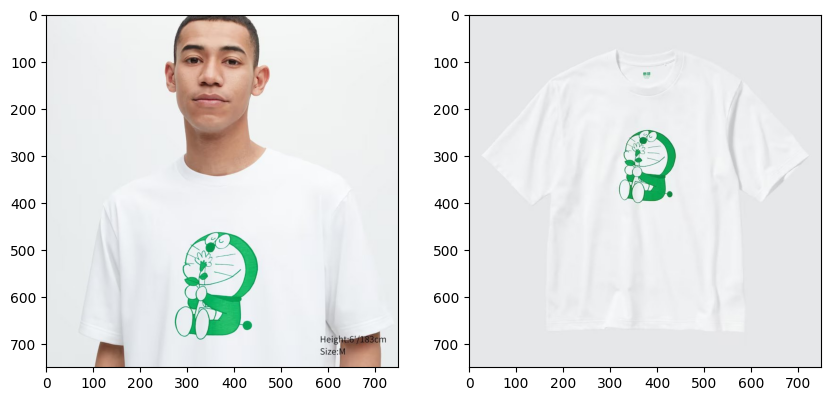

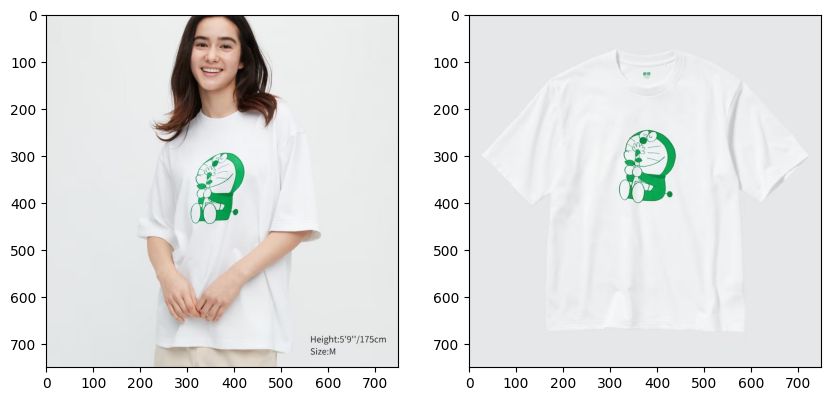

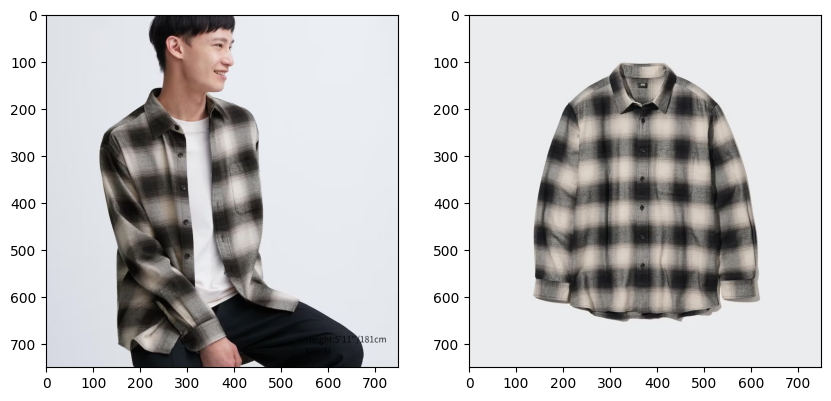

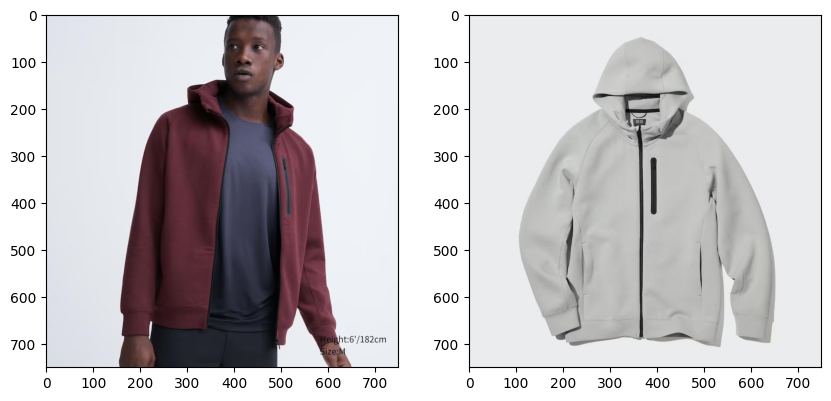

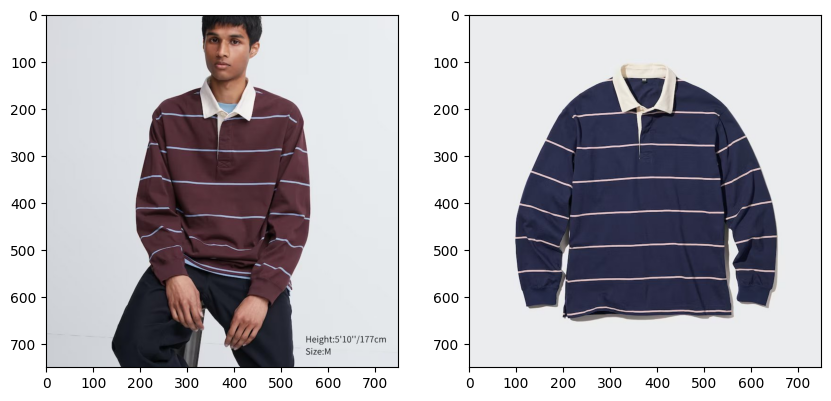

...

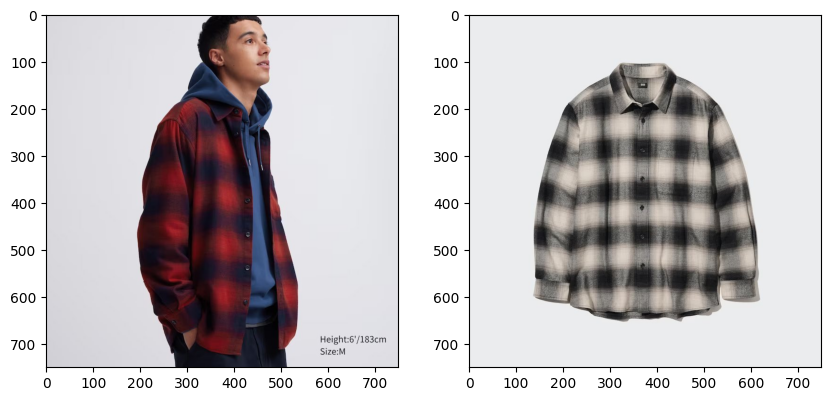

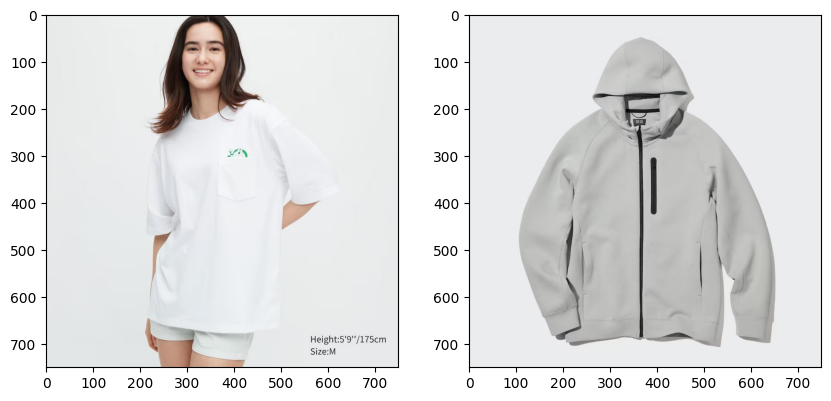

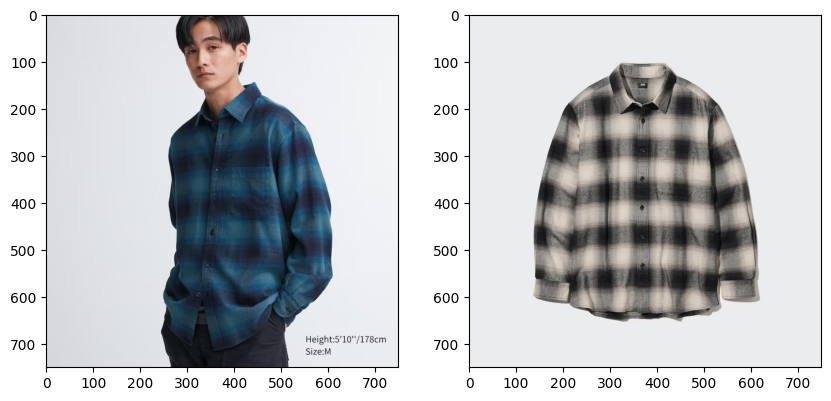

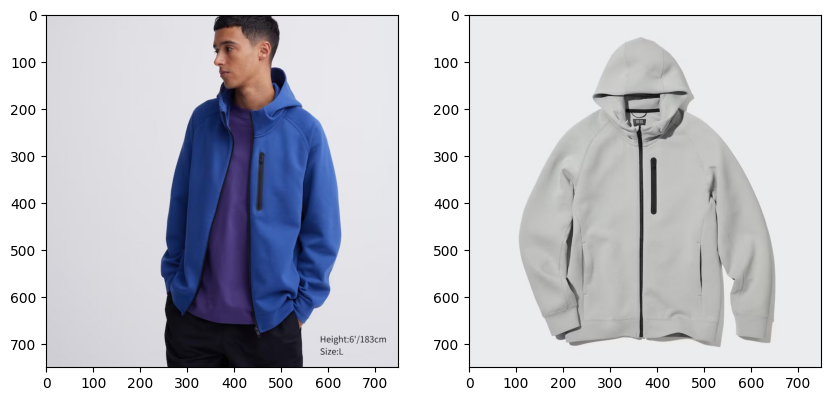

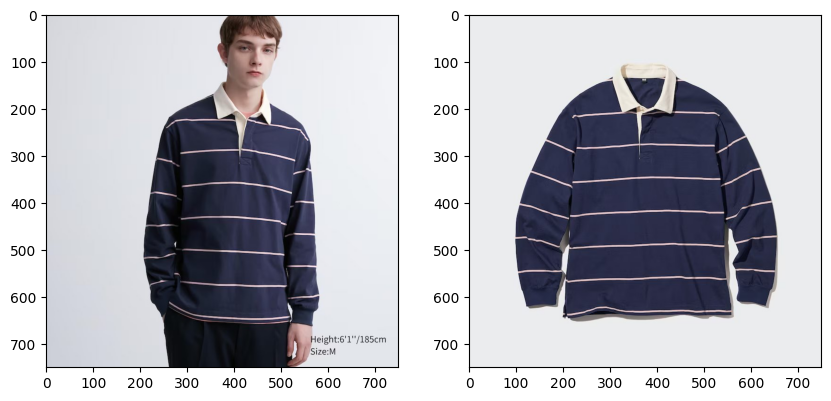

In [90]:
base_model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
base_model.eval()
feature_extractor = nn.Sequential(base_model.features, base_model.avgpool)

for param in feature_extractor.parameters():
    param.requires_grad = False

transforms_needed = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(224, antialias=True),
])

(inputs_tensors, inputs_label), (target_tensors, target_label) = load_data(data_path, transforms_needed)
print(f"{inputs_tensors.shape = }, {target_tensors.shape = }")

target_tensors = feature_extractor(target_tensors)
inputs_tensors = feature_extractor(inputs_tensors)
print(f"{inputs_tensors.shape = }, {target_tensors.shape = }")

targer_sapce = torch.squeeze(target_tensors, dim = (2,3))
result = torch.squeeze(inputs_tensors, dim = (2,3))
print(f"{targer_sapce.shape = }, {result.shape = }")

targer_sapce = nn.functional.normalize(targer_sapce, p=2, dim=1)
result = nn.functional.normalize(result, p=2, dim=1)

targer_sapce = torch.transpose(targer_sapce,dim0=0, dim1=1)
dot_products, top_class = torch.mm(result, targer_sapce).topk(1)

# for file, top_match in zip(inputs_label, top_class):
#     print(f"{file} == {target_label[top_match]}")

for i, (file, predecition) in enumerate(zip(inputs_label, top_class)):
    
    sample = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/inputs/"+file
    sample = Image.open(sample)
    predecition = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/target/"+target_label[predecition.item()]
    predecition = Image.open(predecition)
    fig = plt.figure(figsize=(10,7))
    fig.add_subplot(1, 2, 1)
    plt.imshow(sample)
    fig.add_subplot(1, 2, 2)
    plt.imshow(predecition)


### googlenet


In [64]:
base_model = models.googlenet(weights=models.GoogLeNet_Weights.DEFAULT)
base_model

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

inputs_tensors.shape = torch.Size([15, 3, 224, 224]), target_tensors.shape = torch.Size([6, 3, 224, 224])
inputs_tensors.shape = torch.Size([15, 1024, 1, 1]), target_tensors.shape = torch.Size([6, 1024, 1, 1])
targer_sapce.shape = torch.Size([6, 1024]), result.shape = torch.Size([15, 1024])


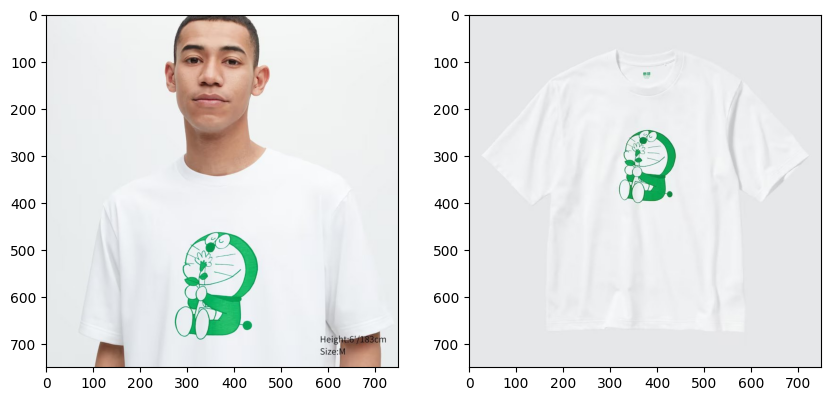

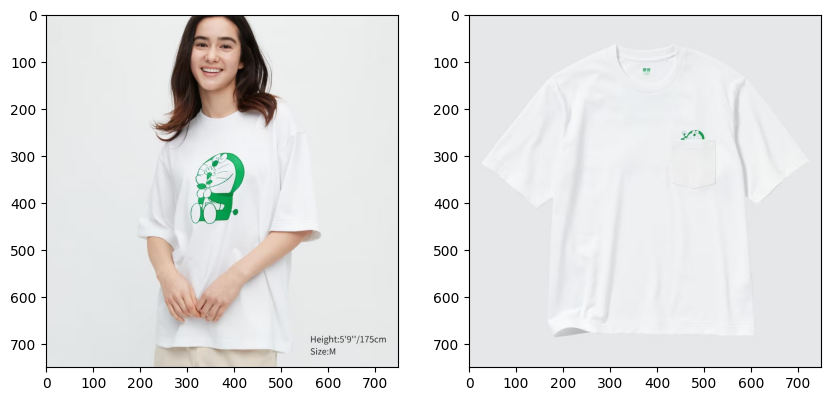

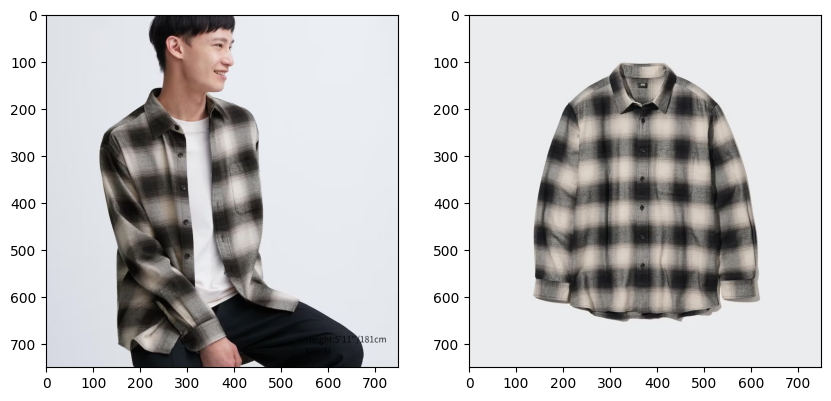

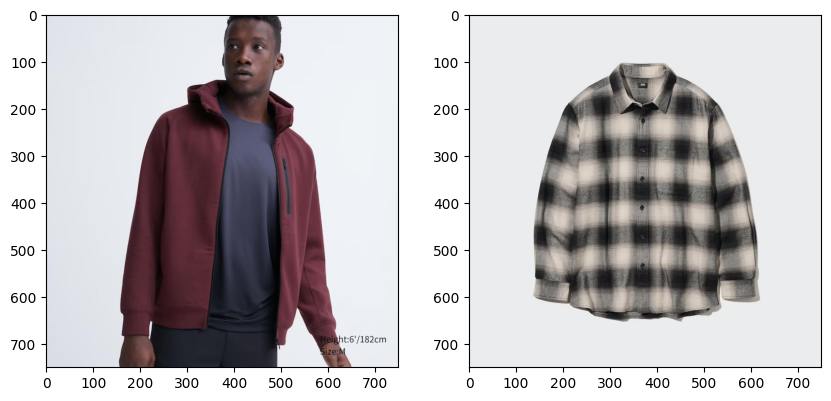

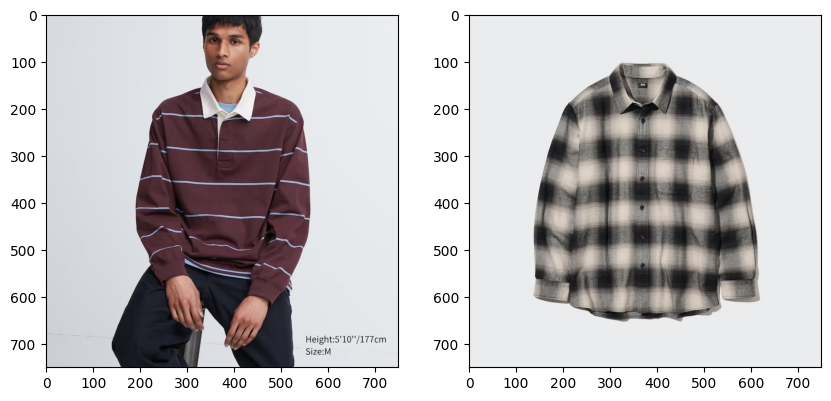

...

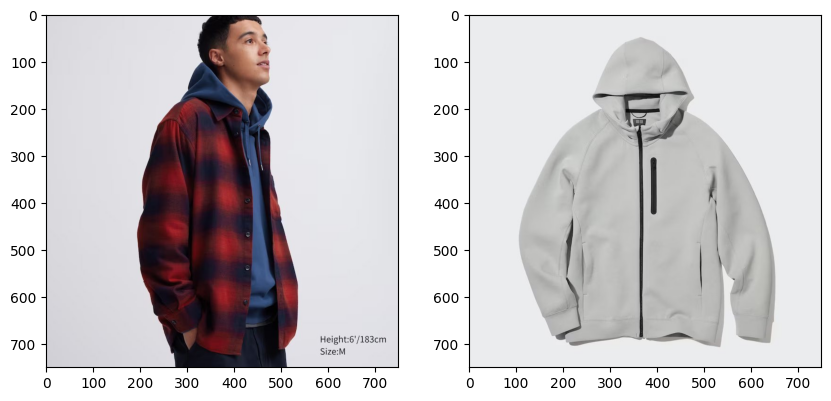

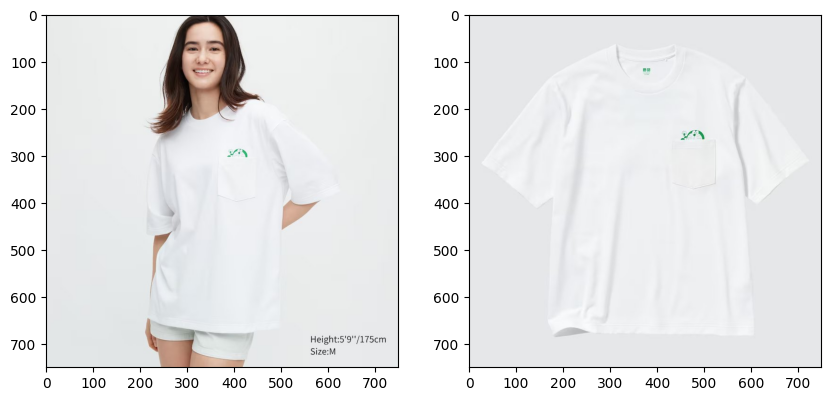

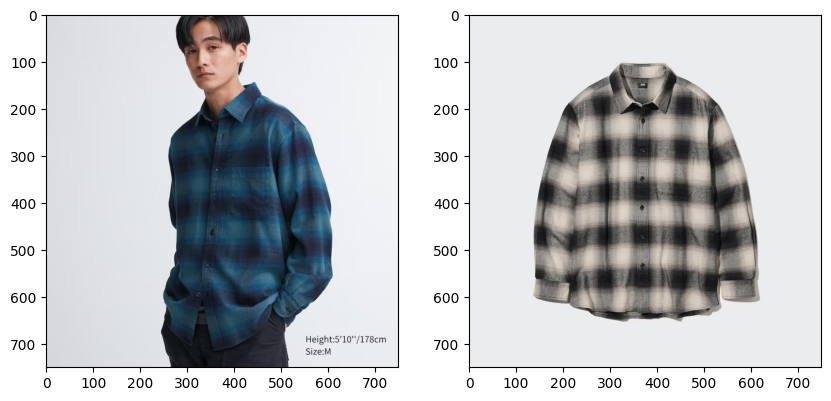

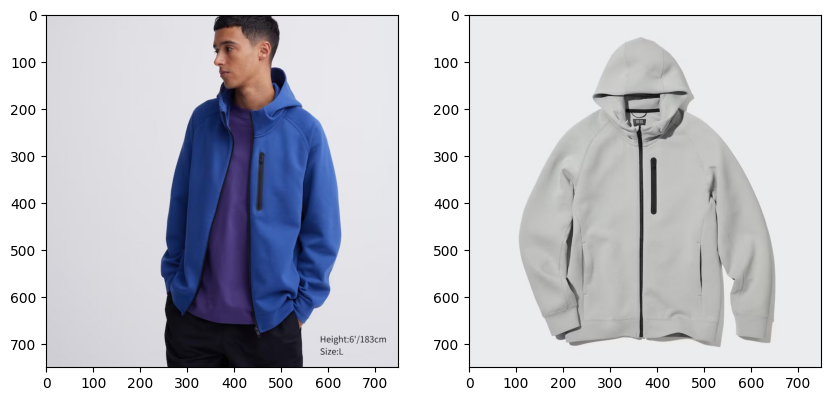

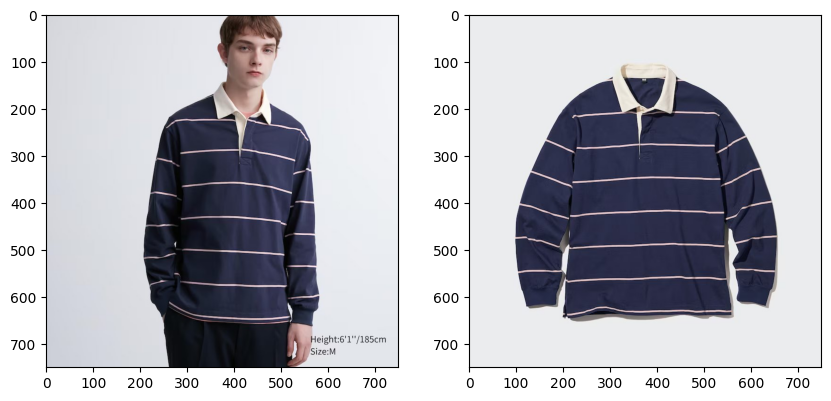

In [94]:
base_model = models.googlenet(weights=models.GoogLeNet_Weights.DEFAULT)
base_model.eval()
feature_extractor = nn.Sequential(*list(base_model.children())[:-1])

for param in feature_extractor.parameters():
    param.requires_grad = False

transforms_needed = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(224, antialias=True),
])

(inputs_tensors, inputs_label), (target_tensors, target_label) = load_data(data_path, transforms_needed)
print(f"{inputs_tensors.shape = }, {target_tensors.shape = }")

target_tensors = feature_extractor(target_tensors)
inputs_tensors = feature_extractor(inputs_tensors)
print(f"{inputs_tensors.shape = }, {target_tensors.shape = }")

targer_sapce = torch.squeeze(target_tensors, dim = (2,3))
result = torch.squeeze(inputs_tensors, dim = (2,3))
print(f"{targer_sapce.shape = }, {result.shape = }")

targer_sapce = nn.functional.normalize(targer_sapce, p=2, dim=1)
result = nn.functional.normalize(result, p=2, dim=1)

targer_sapce = torch.transpose(targer_sapce,dim0=0, dim1=1)
dot_products, top_class = torch.mm(result, targer_sapce).topk(1)

# for file, top_match in zip(inputs_label, top_class):
#     print(f"{file} == {target_label[top_match]}")

for i, (file, predecition) in enumerate(zip(inputs_label, top_class)):
    
    sample = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/inputs/"+file
    sample = Image.open(sample)
    predecition = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/target/"+target_label[predecition.item()]
    predecition = Image.open(predecition)
    fig = plt.figure(figsize=(10,7))
    fig.add_subplot(1, 2, 1)
    plt.imshow(sample)
    fig.add_subplot(1, 2, 2)
    plt.imshow(predecition)


In [68]:
feature_extractor

Sequential(
  (0): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (4): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (5): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (bra

In [72]:
target_tensors.view(6,1024).sum(dim=1)

tensor([320.6199, 286.5831, 318.7265, 251.7274, 332.8557, 283.0399])

### temp


In [ ]:
base_model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
base_model.eval()
feature_extractor = nn.Sequential(base_model.features, base_model.avgpool)

for param in feature_extractor.parameters():
    param.requires_grad = False

transforms_needed = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(224, antialias=True),
])

(inputs_tensors, inputs_label), (target_tensors, target_label) = load_data(data_path, transforms_needed)
print(f"{inputs_tensors.shape = }, {target_tensors.shape = }")

target_tensors = feature_extractor(target_tensors)
inputs_tensors = feature_extractor(inputs_tensors)
print(f"{inputs_tensors.shape = }, {target_tensors.shape = }")

targer_sapce = torch.squeeze(target_tensors, dim = (2,3))
result = torch.squeeze(inputs_tensors, dim = (2,3))
print(f"{targer_sapce.shape = }, {result.shape = }")

targer_sapce = torch.transpose(targer_sapce,dim0=0, dim1=1)
dot_products, top_class = torch.mm(result, targer_sapce).topk(1)

# for file, top_match in zip(inputs_label, top_class):
#     print(f"{file} == {target_label[top_match]}")

for i, (file, predecition) in enumerate(zip(inputs_label, top_class)):
    
    sample = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/inputs/"+file
    sample = Image.open(sample)
    predecition = "./assets/ImageMatch_UNIQOExample/Calssified_jpg/target/"+target_label[predecition.item()]
    predecition = Image.open(predecition)
    fig = plt.figure(figsize=(10,7))
    fig.add_subplot(1, 2, 1)
    plt.imshow(sample)
    fig.add_subplot(1, 2, 2)
    plt.imshow(predecition)
